# **Taller de Python Avanzado**

### Semana IF 2024, impartido por Julián Sánchez, Brandon Obregón y Javier Fernández

---
---
# **Parte I** - La física computacional

---
# **Pandas** - Python para Ciencia y Análisis de Datos

![pandas](https://upload.wikimedia.org/wikipedia/commons/thumb/e/ed/Pandas_logo.svg/1920px-Pandas_logo.svg.png)

Pandas es una librería especializada en la ciencia y el manejo de grandes cantidades de datos. Con esta librería es posible la lectura de datos de gran variedad de formatos como CSV, Excel, SQL, JSON, HDF5, etc. Además, se facilita la limpieza de los datos importados, su manejo y la aplicación de operaciones.

Su estructura principal es el DataFrame, que sirve para almacenar y manipular tablas de forma intuitiva.

El formato de los DataFrames es de columnas para las características y de filas para las series de datos. Un DataFrame se puede crear a partir de un diccionario o importar desde los formatos previamente mencionados.

## Librerías

In [ ]:
# Librería Principal
import pandas as pd


# Datos de Ejemplo
import seaborn as sns
healthexp = sns.load_dataset('healthexp')
glue = sns.load_dataset('glue')

## Repaso Breve de Pandas

Las funciones principales para el uso de pandas son la lectura y escritura de DataFrames así como la presentación de información básica del

In [ ]:
penguins = pd.read_csv('https://raw.githubusercontent.com/mwaskom/seaborn-data/master/penguins.csv')
penguins.head()
#penguins.tail()
#penguins["species"].unique()
#penguins.describe()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


## Cálculos entre columnas

In [ ]:
# Queremos calcular, por alguna razón, el área superficial del pico del pingüino

penguins['area_mm2'] = penguins['bill_length_mm'] * penguins['bill_depth_mm']
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,area_mm2
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE,731.17
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE,687.30
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE,725.40
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE,708.31


## Agrupaciones Sencillas

In [ ]:
# Crear un nuevo dataframe de pinguinos con todas las columnas excepto las de sexo
penguins_no_sex = penguins.drop(columns=['sex'])
penguins_no_sex.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,area_mm2
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,731.17
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,687.30
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,725.40
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,708.31


In [ ]:
# Agrupar los pingüinos según su especie
penguins_grouped = penguins_no_sex.groupby("species").mean(numeric_only=True)
penguins_grouped

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,area_mm2
species,,,,,
Adelie,38.791391,18.346358,189.953642,3700.662252,712.940927
Chinstrap,48.833824,18.420588,195.823529,3733.088235,901.989118
Gentoo,47.504878,14.982114,217.186992,5076.016260,713.653252


## Agrupaciones múltiples

In [ ]:
# Agrupar pingüinos por especie, isla y sexo
penguins_grouped = penguins.groupby(["species", "island", "sex"]).mean(numeric_only=True)
penguins_grouped

# Cambio de orden
#penguins_grouped = penguins.groupby(["sex", "island", "species"]).mean(numeric_only=True)
#penguins_grouped

# Ignorar cierta característica
#penguins_grouped = penguins.groupby(["sex", "species"]).mean(numeric_only=True)
#penguins_grouped


bill_length_mm  bill_depth_mm  flipper_length_mm  \
species   island    sex                                                        
Adelie    Biscoe    FEMALE       37.359091      17.704545         187.181818   
                    MALE         40.590909      19.036364         190.409091   
          Dream     FEMALE       36.911111      17.618519         187.851852   
                    MALE         40.071429      18.839286         191.928571   
          Torgersen FEMALE       37.554167      17.550000         188.291667   
                    MALE         40.586957      19.391304         194.913043   
Chinstrap Dream     FEMALE       46.573529      17.588235         191.735294   
                    MALE         51.094118      19.252941         199.911765   
Gentoo    Biscoe    FEMALE       45.563793      14.237931         212.706897   
                    MALE         49.473770      15.718033         221.540984   

                            body_mass_g    area_mm2  
species   island    sex                              
Adelie    Biscoe    FEMALE  3369.318182  661.624545  
                    MALE    4050.000000  773.051364  
          Dream     FEMALE  3344.444444  651.124815  
                    MALE    4045.535714  755.057857  
          Torgersen FEMALE  3395.833333  658.921250  
                    MALE    4034.782609  786.105652  
Chinstrap Dream     FEMALE  3527.205882  819.750294  
                    MALE    3938.970588  984.227941  
Gentoo    Biscoe    FEMALE  4679.741379  649.202931  
                    MALE    5484.836066  778.238689

## Hallar información sobre casos particulares de los datos

In [ ]:
# Parámetros
print( "Más pesado: ", penguins_grouped["body_mass_g"].max(),
       "\nPromedio de peso: ", penguins_grouped["body_mass_g"].mean())


# El Pingüino más pesado en promedio
#penguins_grouped.loc[penguins_grouped["body_mass_g"] == penguins_grouped["body_mass_g"].max()]


# Pingünios en promedio más pesados que el promedio
#penguins_grouped.loc[penguins_grouped["body_mass_g"] > penguins_grouped["body_mass_g"].mean()]

Más pesado:  5484.836065573771 
Promedio de peso:  3987.066819804968


In [ ]:
penguins_grouped

bill_length_mm  bill_depth_mm  flipper_length_mm  \
species   island    sex                                                        
Adelie    Biscoe    FEMALE       37.359091      17.704545         187.181818   
                    MALE         40.590909      19.036364         190.409091   
          Dream     FEMALE       36.911111      17.618519         187.851852   
                    MALE         40.071429      18.839286         191.928571   
          Torgersen FEMALE       37.554167      17.550000         188.291667   
                    MALE         40.586957      19.391304         194.913043   
Chinstrap Dream     FEMALE       46.573529      17.588235         191.735294   
                    MALE         51.094118      19.252941         199.911765   
Gentoo    Biscoe    FEMALE       45.563793      14.237931         212.706897   
                    MALE         49.473770      15.718033         221.540984   

                            body_mass_g    area_mm2  
species   island    sex                              
Adelie    Biscoe    FEMALE  3369.318182  661.624545  
                    MALE    4050.000000  773.051364  
          Dream     FEMALE  3344.444444  651.124815  
                    MALE    4045.535714  755.057857  
          Torgersen FEMALE  3395.833333  658.921250  
                    MALE    4034.782609  786.105652  
Chinstrap Dream     FEMALE  3527.205882  819.750294  
                    MALE    3938.970588  984.227941  
Gentoo    Biscoe    FEMALE  4679.741379  649.202931  
                    MALE    5484.836066  778.238689

In [ ]:
# Información específica en dataframes
penguins_grouped.iloc[0,0]
# penguins_grouped.iloc[:,0]
# penguins_grouped.iloc[0,:]
# penguins_grouped.iloc[2:,-1]


# Iteración de Filas

# for index, row in penguins_grouped.iterrows():
#   print(index)
#   print(row)

species    island     sex   
Adelie     Dream      FEMALE    651.124815
                      MALE      755.057857
           Torgersen  FEMALE    658.921250
                      MALE      786.105652
Chinstrap  Dream      FEMALE    819.750294
                      MALE      984.227941
Gentoo     Biscoe     FEMALE    649.202931
                      MALE      778.238689
Name: area_mm2, dtype: float64

---
# **Plotly** - Graficos y Visualización de Alta Calidad

![plotly](https://upload.wikimedia.org/wikipedia/commons/8/8a/Plotly-logo.png)

Para desarrollar el potencial verdaderamente: https://plotly.com/python/

Plotly es capaz de generar gráficos complejos y de alta calidad que son interactivos por naturaleza, permitiendo a los usuarios hacer zoom, panear o actualizar los gráficos en tiempo real. Se aplica en áreas como la ciencia de datos y la ingeniería de datos, porque permite una exploración detallada y la presentación clara de los resultados.

Además de los gráficos básicos como líneas, barras y diagramas de dispersión, soporta visualizaciones avanzadas como mapas de calor, gráficos 3D y mapas geográficos.

Se pueden hacer aplicaciones móviles y web fácilmente por medio del framework Dash.

## Librerías

In [ ]:
# Para gráficos sencillos
import plotly.express as px


# Para gráficos más complejos
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## Integración con Pandas

 Usualmente se trabaja con Pandas para el manejo de los datos.

### Gráfico de Línea

In [ ]:
healthexp.head()

,Year,Country,Spending_USD,Life_Expectancy
0,1970,Germany,252.311,70.6
1,1970,France,192.143,72.2
2,1970,Great Britain,123.993,71.9
3,1970,Japan,150.437,72.0
4,1970,USA,326.961,70.9


In [ ]:
fig = px.line(healthexp, x="Year", y="Life_Expectancy", color="Country", title="Life Expectancy per Year")
fig.show()

In [ ]:
fig = px.bar(healthexp, x="Year", y="Spending_USD", color="Country", title="Spending in USD per Year")
fig.show()

In [ ]:
fig = px.scatter(healthexp, x="Year", y="Life_Expectancy",
                 color="Country",
                 size="Spending_USD")
fig.show()

### Gráficos de Proporciones

In [ ]:
# Modificar el dataframe de health expectancy para décadas
healthexp["Decade"] = (healthexp["Year"] // 10) * 10
healthexp_by_decade = healthexp.groupby(["Decade", "Country"]).agg({"Life_Expectancy": "mean", "Spending_USD": "sum"})
healthexp_by_decade

Life_Expectancy  Spending_USD
Decade Country                                     
1970   Canada               73.900000      1548.997
       France               72.600000       555.753
       Germany              71.610000      5026.302
       Great Britain        71.900000       258.165
       Japan                74.150000      2721.607
       USA                  72.300000      5660.151
1980   Canada               76.180000     11778.433
       France               74.850000      1660.971
       Germany              74.540000     12646.231
       Great Britain        74.530000      5481.916
       Japan                77.530000      7850.034
       USA                  74.590000     16779.259
1990   Canada               78.030000     19850.965
       France               77.980000     19499.007
       Germany              76.933333     20562.073
       Great Britain        76.650000     11639.497
       Japan                79.790000     13879.720
       USA                  75.940000     35369.062
2000   Canada               79.990000     32153.118
       France               80.300000     32849.903
       Germany              79.280000     34726.771
       Great Britain        79.040000     26693.677
       Japan                82.110000     23849.488
       USA                  77.540000     61973.021
2010   Canada               81.770000     47014.410
       France               82.480000     46546.025
       Germany              80.850000     53463.650
       Great Britain        81.130000     38378.321
       Japan                83.680000     41906.663
       USA                  78.730000     92176.425
2020   Canada               81.700000      5828.324
       France               82.300000      5468.418
       Germany              81.100000      6938.983
       Great Britain        80.400000      5018.700
       Japan                84.700000      4665.641
       USA                  77.000000     11859.179

In [ ]:
# Hacer un gráfico pastel para cada década en términos de spending por país

fig = make_subplots(rows=2, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}],[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])
row = 1
col = 1
for decade in healthexp_by_decade.index.get_level_values(0).unique():
  fig.add_trace(go.Pie(labels=healthexp_by_decade.loc[decade].index, values=healthexp_by_decade.loc[decade]["Spending_USD"], title=f"Decade {decade}"), row, col)
  col+=1
  if col > 3:
    col = 1
    row+=1
fig.update_layout(title_text="Spending by Country and Decade")
fig.show()


In [ ]:
glue.head()

,Model,Year,Encoder,Task,Score
0,ERNIE,2019,Transformer,CoLA,75.5
1,T5,2019,Transformer,CoLA,71.6
2,RoBERTa,2019,Transformer,CoLA,67.8
3,BERT,2018,Transformer,CoLA,60.5
4,BiLSTM+ELMo,2018,LSTM,CoLA,32.1


In [ ]:
# Gráfico de glue con Year en eje X, Score en eje Y y codificación de color según modelo

fig = px.bar(glue, x="Year", y="Score", color="Model")
fig.show()

In [ ]:
# Gráfico de cajas para cada modelo

fig = px.box(glue, x="Model", y="Score")
fig.show()

## Otros Gráficos

#### Gráficos con Selección

Ejemplo tomado directamente de https://plotly.com/python/dropdowns/#update-dropdown

In [ ]:
import plotly.graph_objects as go

import pandas as pd

# Load dataset
df = pd.read_csv(
    "https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv")
df.columns = [col.replace("AAPL.", "") for col in df.columns]

# Initialize figure
fig = go.Figure()

# Add Traces

fig.add_trace(
    go.Scatter(x=list(df.Date),
               y=list(df.High),
               name="High",
               line=dict(color="#33CFA5")))

fig.add_trace(
    go.Scatter(x=list(df.Date),
               y=[df.High.mean()] * len(df.index),
               name="High Average",
               visible=False,
               line=dict(color="#33CFA5", dash="dash")))

fig.add_trace(
    go.Scatter(x=list(df.Date),
               y=list(df.Low),
               name="Low",
               line=dict(color="#F06A6A")))

fig.add_trace(
    go.Scatter(x=list(df.Date),
               y=[df.Low.mean()] * len(df.index),
               name="Low Average",
               visible=False,
               line=dict(color="#F06A6A", dash="dash")))

# Add Annotations and Buttons
high_annotations = [dict(x="2016-03-01",
                         y=df.High.mean(),
                         xref="x", yref="y",
                         text="High Average:<br> %.3f" % df.High.mean(),
                         ax=0, ay=-40),
                    dict(x=df.Date[df.High.idxmax()],
                         y=df.High.max(),
                         xref="x", yref="y",
                         text="High Max:<br> %.3f" % df.High.max(),
                         ax=-40, ay=-40)]
low_annotations = [dict(x="2015-05-01",
                        y=df.Low.mean(),
                        xref="x", yref="y",
                        text="Low Average:<br> %.3f" % df.Low.mean(),
                        ax=0, ay=40),
                   dict(x=df.Date[df.High.idxmin()],
                        y=df.Low.min(),
                        xref="x", yref="y",
                        text="Low Min:<br> %.3f" % df.Low.min(),
                        ax=0, ay=40)]

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="None",
                     method="update",
                     args=[{"visible": [True, False, True, False]},
                           {"title": "Yahoo",
                            "annotations": []}]),
                dict(label="High",
                     method="update",
                     args=[{"visible": [True, True, False, False]},
                           {"title": "Yahoo High",
                            "annotations": high_annotations}]),
                dict(label="Low",
                     method="update",
                     args=[{"visible": [False, False, True, True]},
                           {"title": "Yahoo Low",
                            "annotations": low_annotations}]),
                dict(label="Both",
                     method="update",
                     args=[{"visible": [True, True, True, True]},
                           {"title": "Yahoo",
                            "annotations": high_annotations + low_annotations}]),
            ]),
        )
    ])

# Set title
fig.update_layout(title_text="Yahoo")

fig.show()

#### Mapa de Calor y gráfico tridimensional

In [ ]:
import numpy as np

# Generar datos aleatorios para el heatmap y el gráfico 3D
data = np.random.rand(10, 10)

# Crear una figura con subplots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'heatmap'}, {'type': 'surface'}]]
)

# Añadir heatmap
fig.add_trace(
    go.Heatmap(
        z=data,
        colorscale='Viridis'
    ),
    row=1, col=1
)

# Añadir gráfico 3D
fig.add_trace(
    go.Surface(
        z=data,
        colorscale='Viridis'
    ),
    row=1, col=2
)

# Actualizar los títulos de los ejes y la disposición general
fig.update_layout(
    title_text='Heatmap y Gráfico 3D en Plotly',
    width=1200,
    height=700
)

# Mostrar la figura
fig.show()


## Dashboards y aplicaciones

Con la librería Dash, que es parte del proyecto de plotly, es posible crear interfaces interactivas completas, que permiten la visualización de datos, su selección, análisis y mucho más. Es una poderosa herramienta para la ciencia de datos y la creación de herramientas interactivas.

Más información: https://dash.plotly.com/

---
# **Numpy** - Python Numérico a Otro Nivel

![numpy](https://imgs.search.brave.com/k3WM4rmzCLLI_FNdamtyaiglYgCJOjR5vM4EUNIQIjA/rs:fit:860:0:0:0/g:ce/aHR0cHM6Ly9udW1w/eS5vcmcvaW1hZ2Vz/L2xvZ29zL251bXB5/X2xvZ28uc3Zn)

Numpy es un paquete de Python especializado para computación científica, tanto si estás trabajando en pequeños proyectos hasta aplicaciones especializadas de simulaciones computacionales.

Las principales ventajas de utilizar Numpy en nuestro proyectos se debe a la facilidad de utilizar matrices multidimensionales para el almacenamiento o procesamiento de datos, a su vez, brinda un mejor rendimiento en comparación a Python Vanilla.

<br>

---

## **Aplicaciones principales**

- **Arrays:** Numpy provee la función de creación de arrays en N dimensiones, ¿pero qué es realmente un array? Lo podemos entender simplemente como una lista de listas o de nuestros conocimientos de Álgebra Lineal se puede representar como una matriz (O aún mejor como un tensor 🤫).

¿Cómo podemos crear una array con Numpy:





In [ ]:
import numpy as np # Debemos importar el paquete numpy y por facilidad utilizaremos la notación np

# Definir nuestro primer array como una lista de listas
array = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])
print(array)

[[1 2 3]
 [4 5 6]
 [7 8 9]]


In [ ]:
# ¿Realmente es un array? Podemos utiliza la función type()
print(type(array))

<class 'numpy.ndarray'>


In [ ]:
# Algunas veces ocupamos saber las dimensiones de nuestro array, se utiliza la función .shape
print(array.shape)

(3, 3)


### **Pero Numpy es aún más potente**

Veamos algunos casos prácticos:


In [ ]:
# Podemos crear matrices de forma rápida
ceros = np.zeros(shape=(2, 3))
print(ceros)

print("\n")
unos = np.ones(shape=(2, 4))
print(unos)

[[0. 0. 0.]
 [0. 0. 0.]]


[[1. 1. 1. 1.]
 [1. 1. 1. 1.]]


In [ ]:
# También podemos crear una lista espaciada

# (Punto inicial, Punto final, espaciado)
list_1 = np.arange(20, 30, 1)
print("Lista con arange:", list_1)

# (Punto inicial, Punto final, # Puntos)
list_2 = np.linspace(20, 30, 5)
print('La lista: {}, se realizó con np.linspace()'.format(list_2))


Lista con arange: [20 21 22 23 24 25 26 27 28 29]
La lista: [20.  22.5 25.  27.5 30. ], se realizó con np.linspace()


In [ ]:
# También podemos crear números pseudo - aleatorios

pseudo = np.random.rand(3, 3)
print(pseudo)



[[0.60711019 0.84535456 0.02675787]
 [0.74556093 0.27608656 0.4778799 ]
 [0.4039569  0.88526646 0.49775066]]


In [ ]:
# Veamos cómo acceder a un valor (Fila, columna):

print(pseudo[1, 1])

0.27608656254109065


## **Caminata aleatoria en 2D**

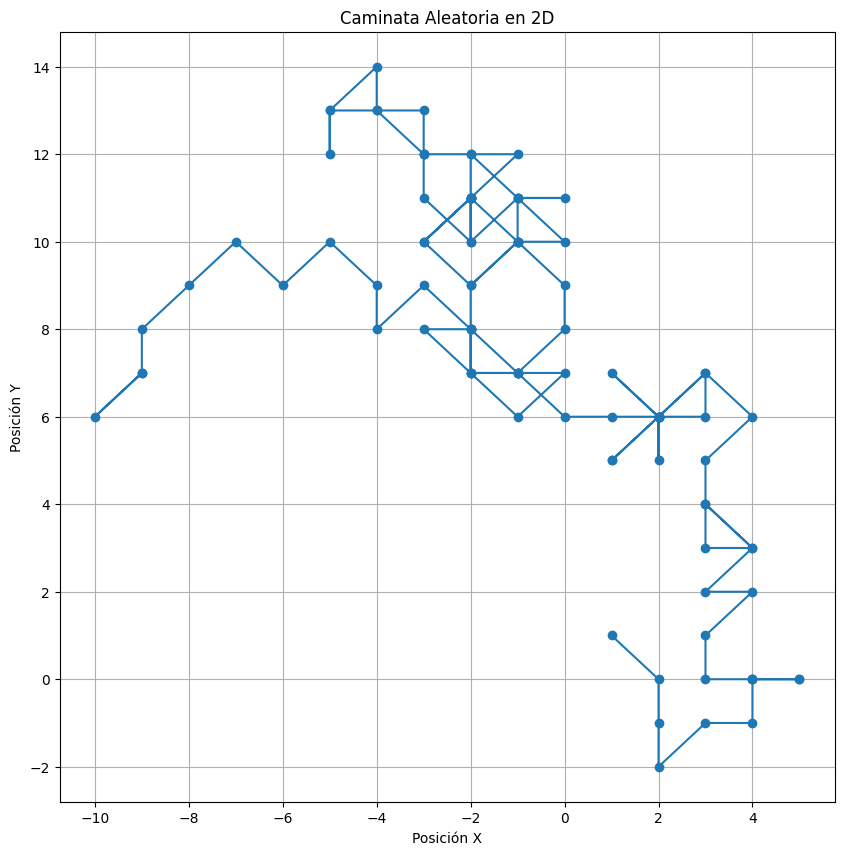

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Número de pasos
num_steps = 100

# Generamos dos arrays de desplazamientos aleatorios (-1, 0, 1)
# Uno para el eje X y otro para el eje Y
steps_x = np.random.choice([-1, 0, 1], size=num_steps)
steps_y = np.random.choice([-1, 0, 1], size=num_steps)

# Calculamos las posiciones acumuladas en el tiempo
positions_x = np.cumsum(steps_x)
positions_y = np.cumsum(steps_y)

# Graficamos la caminata
plt.figure(figsize=(10, 10))
plt.plot(positions_x, positions_y, linestyle='-', marker='o')
plt.title('Caminata Aleatoria en 2D')
plt.xlabel('Posición X')
plt.ylabel('Posición Y')
plt.grid(True)
plt.show()

## **El mundo después de este taller**

* Numpy posee una amplia variedad de funciones especializas en estadísica:
https://numpy.org/doc/stable/reference/routines.statistics.html

* También posee una amplia variedad de funciones matemáticas previamente definidas:
https://numpy.org/doc/stable/reference/routines.math.html

---
# **Numba** - Python de Alto Rendimiento


![numba](https://drive.google.com/uc?id=1Tt41E08lH4ba8UPfr7YkiHJP_ZJvoWQE)

Numba es una libreria en Python diseñada para aceleración de rendimiento en Python con bajo esfuerzo, mediante la compilación Just-In-Time (JIT).

<br>

---

<br>

### **¿Cómo funciona Numba?**

Numba analizará y optimizará tu código con el objetivo de minimizar el tiempo de ejecución tanto como sea posible, emplea el compilador LLVM (Low Level Virtual Machine) para mejorar los tiempos de ejecución.

<br>

---

<br>

### **Principales características de Numba**


*   **Compilación Just-In-Time (JIT):** Numba compila **funciones** de Python para compilar en LLVM; se obtiene un rendimiento similar a lenguajes como C o Fortran.

*   **Decoradores:** El uso de decoradores le indica a Numba cuáles funciones deseamos optimizar; el decorador principal corresponde a **'@jit'**, mientras que **'@njit'** corresponde a una versión más restrictiva.

* **Soporte con NumPy:** Una de las grandes ventajas de Numba es que permite trabajar con arrays de NumPy, permitiendo así optimizar aún más el rendimiento matricial.

* **Soporte para CUDA:** Numba soporta operaciones CUDA [Nvidia CUDA] para ejecutar código de Python directamente en GPU; permitiendo mejorar el rendimiento en simulaciones físicas, números, machine learning entre otras.


<br>

---

<br>

### **¿Dónde utilizar Numba?**

* **Cálculo numérico intensivo:** Cuando se trata de aceleración de loops y operaciones matemáticas de alta intensidad Numba y su combinación con NumPy resultan ser altamente eficaz.

* **Simulación científica:** Simulaciones físicas, químicas, biológicas (entre otras) son altamente demandantes en recursos computacionales, es por esto que optimizar nuestro código resulta de gran interés (Ahorro de tiempo y recursos computacionales = $$).

* **Machine Learning**

* **Data Science**

<br>

---

<br>

### **Librerias compatibles con Numba:**

* NumPy

* Math y cmath

* Random

* Scipy (Basadas en NumPy)

* CUDA

<br>

### **Librerias NO compatibles con Numba:**

* Pandas

* Scikit-learn

* Matplotlib

* TensorFlow

<br>

---














## Librerías

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import time
from numba import jit

## **Aproximación de pi mediante Montecarlo**

In [ ]:
## Implementación sin Numba

def montecarlo_pi(n):
    x = np.random.random(n)
    y = np.random.random(n)
    return (x*x + y*y <= 1).sum() * 4. / n

num_samples = 3*10**8
start_time = time.time()
pi_estimate = montecarlo_pi(num_samples)
end_time = time.time()

print(f"Estimación de π sin Numba: {pi_estimate}")
print(f"Tiempo sin Numba: {end_time - start_time} segundos")

Estimación de π sin Numba: 3.14152652
Tiempo sin Numba: 9.110131025314331 segundos


In [ ]:
## Implementación con Numba

@jit
def montecarlo_pi(n):
    x = np.random.random(n)
    y = np.random.random(n)
    return (x*x + y*y <= 1).sum() * 4. / n

num_samples = 3*10**8
start_time = time.time()
pi_estimate = montecarlo_pi(num_samples)
end_time = time.time()

print(f"Estimación de π sin Numba: {pi_estimate}")
print(f"Tiempo sin Numba: {end_time - start_time} segundos")

Estimación de π sin Numba: 3.1416639066666665
Tiempo sin Numba: 15.659728288650513 segundos


## **Mandelbrot set**

Tiempo sin Numba: 24.791217803955078 segundos


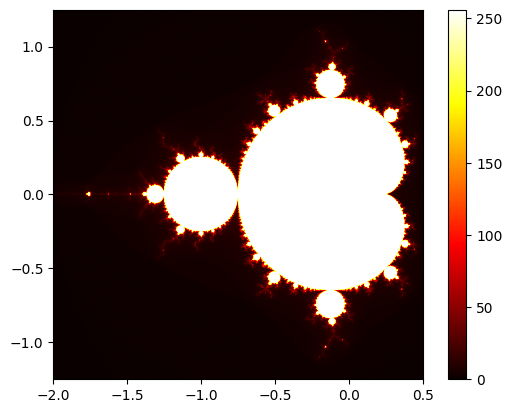

In [ ]:
### Implementación de Mandelbrot Set sin Numba

def mandelbrot(c, max_iter):
    z = c
    for n in range(max_iter):
        if abs(z) > 2:
            return n
        z = z*z + c
    return max_iter

def mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter):
    r1 = np.linspace(xmin, xmax, width)
    r2 = np.linspace(ymin, ymax, height)
    n3 = np.empty((width, height))
    for i in range(width):
        for j in range(height):
            n3[i, j] = mandelbrot(r1[i] + 1j*r2[j], max_iter)
    return (r1, r2, n3)

# Parámetros
xmin, xmax, ymin, ymax = -2.0, 0.5, -1.25, 1.25
width, height = 1000, 1000
max_iter = 256

start_time = time.time()
r1, r2, mandelbrot_image = mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter)
end_time = time.time()

print(f"Tiempo sin Numba: {end_time - start_time} segundos")

plt.imshow(mandelbrot_image.T, extent=[xmin, xmax, ymin, ymax], cmap='hot')
plt.colorbar()
plt.show()

Tiempo con Numba: 1.8958206176757812 segundos


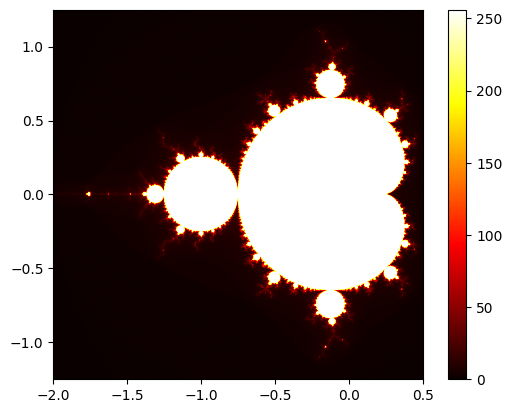

In [ ]:
### Implementación de Mandelbrot Set con Numba

@jit
def mandelbrot(c, max_iter):
    z = c
    for n in range(max_iter):
        if abs(z) > 2:
            return n
        z = z*z + c
    return max_iter

@jit
def mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter):
    r1 = np.linspace(xmin, xmax, width)
    r2 = np.linspace(ymin, ymax, height)
    n3 = np.empty((width, height))
    for i in range(width):
        for j in range(height):
            n3[i, j] = mandelbrot(r1[i] + 1j*r2[j], max_iter)
    return (r1, r2, n3)

# Parámetros
xmin, xmax, ymin, ymax = -2.0, 0.5, -1.25, 1.25
width, height = 1000, 1000
max_iter = 256

start_time = time.time()
r1, r2, mandelbrot_image = mandelbrot_set(xmin, xmax, ymin, ymax, width, height, max_iter)
end_time = time.time()

print(f"Tiempo con Numba: {end_time - start_time} segundos")

plt.imshow(mandelbrot_image.T, extent=[xmin, xmax, ymin, ymax], cmap='hot')
plt.colorbar()
plt.show()

## **Ecuación del Calor**

Tiempo sin Numba: 21.092872858047485 segundos


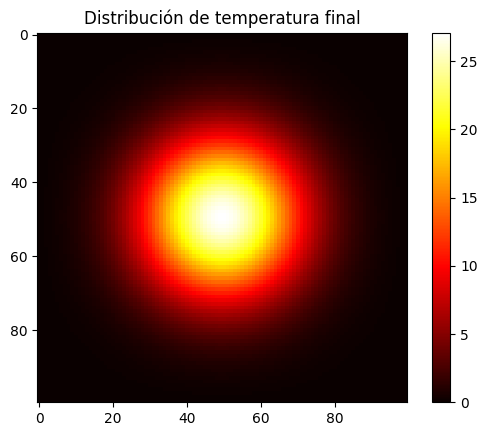

In [ ]:
def solve_heat_equation(u, num_steps, alpha):
    nx, ny = u.shape
    u_new = np.copy(u)

    for step in range(num_steps):
        for i in range(1, nx-1):
            for j in range(1, ny-1):
                u_new[i, j] = u[i, j] + alpha * (
                    u[i+1, j] + u[i-1, j] + u[i, j+1] + u[i, j-1] - 4*u[i, j]
                )
        u = np.copy(u_new)

    return u

# Parámetros de la simulación
nx, ny = 100, 100
u = np.zeros((nx, ny))
u[40:60, 40:60] = 100.0  # Condición inicial: región caliente en el centro
num_steps = 1000
alpha = 0.1  # Coeficiente de difusión

start_time = time.time()
u = solve_heat_equation(u, num_steps, alpha)
end_time = time.time()

print(f"Tiempo sin Numba: {end_time - start_time} segundos")

plt.imshow(u, cmap='hot')
plt.colorbar()
plt.title("Distribución de temperatura final")
plt.show()

Tiempo con Numba: 0.4409151077270508 segundos


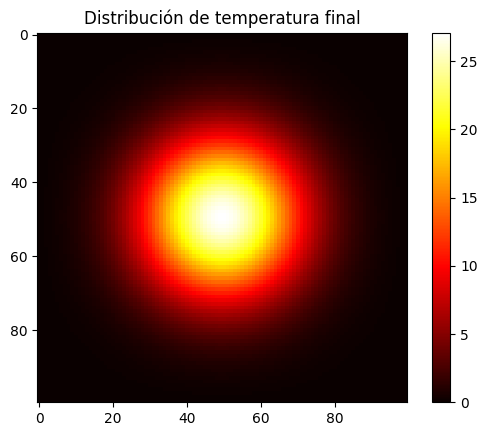

In [ ]:
@jit
def solve_heat_equation(u, num_steps, alpha):
    nx, ny = u.shape
    u_new = np.copy(u)

    for step in range(num_steps):
        for i in range(1, nx-1):
            for j in range(1, ny-1):
                u_new[i, j] = u[i, j] + alpha * (
                    u[i+1, j] + u[i-1, j] + u[i, j+1] + u[i, j-1] - 4*u[i, j]
                )
        u = np.copy(u_new)

    return u

# Parámetros de la simulación
nx, ny = 100, 100
u = np.zeros((nx, ny))
u[40:60, 40:60] = 100.0  # Condición inicial: región caliente en el centro
num_steps = 1000
alpha = 0.1  # Coeficiente de difusión

start_time = time.time()
u = solve_heat_equation(u, num_steps, alpha)
end_time = time.time()

print(f"Tiempo con Numba: {end_time - start_time} segundos")

plt.imshow(u, cmap='hot')
plt.colorbar()
plt.title("Distribución de temperatura final")
plt.show()

## **El Juego de la Vida de Conway**

El Juego de la Vida es un autómata celular donde cada célula en una cuadrícula bidimensional puede estar "viva" o "muerta". La actualización de la cuadrícula se realiza simultáneamente para todas las células en cada paso del tiempo, según las siguientes reglas:

1. **Supervivencia:** Una célula viva con 2 o 3 vecinos vivos sigue viva.

2. **Muerte:** Una célula viva con menos de 2 o más 3 vecinos vivos muere.

3. **Nacimiento:** Una célula muerta con exactamente 3 vecinos vivos se converte en una célula viva.  


In [ ]:

def update(grid):
    new_grid = grid.copy()
    for i in range(1, grid.shape[0] - 1):
        for j in range(1, grid.shape[1] - 1):
            total = (grid[i-1, j-1] + grid[i-1, j] + grid[i-1, j+1] +
                     grid[i, j-1]                 + grid[i, j+1] +
                     grid[i+1, j-1] + grid[i+1, j] + grid[i+1, j+1])
            if grid[i, j] == 1:
                if (total < 2) or (total > 3):
                    new_grid[i, j] = 0
            else:
                if total == 3:
                    new_grid[i, j] = 1
    return new_grid

# Inicialización de la cuadrícula
np.random.seed(0)
grid_size = 200
grid = np.random.randint(2, size=(grid_size, grid_size))

# Configuración para animación
fig, ax = plt.subplots()
img = ax.imshow(grid, interpolation='nearest', cmap='gray')

def animate(frame):
    global grid
    grid = update(grid)
    img.set_data(grid)
    return img,

# Medir el tiempo de ejecución
start_time = time.time()
anim = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)
end_time = time.time()

print(f"Tiempo sin Numba: {end_time - start_time} segundos")

HTML(anim.to_html5_video())

<IPython.core.display.Javascript object>

Tiempo sin Numba: 0.0002913475036621094 segundos


In [ ]:
@jit
def update(grid):
    new_grid = grid.copy()
    for i in range(1, grid.shape[0] - 1):
        for j in range(1, grid.shape[1] - 1):
            total = (grid[i-1, j-1] + grid[i-1, j] + grid[i-1, j+1] +
                     grid[i, j-1]                 + grid[i, j+1] +
                     grid[i+1, j-1] + grid[i+1, j] + grid[i+1, j+1])
            if grid[i, j] == 1:
                if (total < 2) or (total > 3):
                    new_grid[i, j] = 0
            else:
                if total == 3:
                    new_grid[i, j] = 1
    return new_grid

# Inicialización de la cuadrícula
np.random.seed(0)
grid_size = 200
grid = np.random.randint(2, size=(grid_size, grid_size))

# Configuración para animación
fig, ax = plt.subplots()
img = ax.imshow(grid, interpolation='nearest', cmap='gray')

def animate(frame):
    global grid
    grid = update(grid)
    img.set_data(grid)
    return img,

# Medir el tiempo de ejecución
start_time = time.time()
anim = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)
end_time = time.time()

print(f"Tiempo con Numba: {end_time - start_time} segundos")

HTML(anim.to_html5_video())

<IPython.core.display.Javascript object>

Tiempo con Numba: 0.0003190040588378906 segundos


---
---

# **Parte II** - Redes Neuronales
_Una breve aplicación de entrenamiento de modelos para computación científica_

### Semana IF 2024, impartido por Julián Sánchez Castro

---

## Caso práctico: identificación de casos de COVID empleando tomografías computarizadas (CT scan)



## 1) Cargar las librerías

<p style="font-size: 24px;">
  Para trabajar con redes neuronales, haremos uso del framework <strong>Keras</strong>, que ha sido incorporado a <strong>Tensorflow</strong> debido a su facilidad de experimentación, adaptación y simplicidad.

</p>

<p align="center">
  <img src="https://i.imgur.com/0BkUuMW.jpeg" alt="logos de Tensorflow y Keras" style="width: 40%; height: auto;">
</p>

<p style="font-size: 24px;">
  Principalmente trabajaremos con las utilidades de esta librería, sin embargo también haremos uso de las métricas brindadas por <strong>scikit-learn</strong>, una implementación de las herramientas de Machine Learning en Python. Esta puede trabajar para resolver problemas de clasificación, regresión, clustering y muchos más, por lo que es altamente versatil.
</p>

<p align="center">
  <img src="https://amueller.github.io/sklearn_014_015_pydata/sklearn-logo.png" alt="logo de sklearn" style="width: 40%; height: auto;">
</p>

<p style="font-size: 16px;">
  Finalmente, usaremos librerías estándar como numpy, seaborn, pandas, scipy y matplotlib para el procesamiento, manejo y visualización de los datos.
</p>


In [ ]:
# Librerías de preparación
from PIL import Image
import numpy as np
import os

# Librerías del modelo
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
import seaborn as sns
import pandas as pd

# Graficación

from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt

In [ ]:
# Obtención de Imágenes de entrenamiento

!git clone https://github.com/BrandonOG13/Computacional-I.git

!mv ./Computacional-I/TallerML/COVID ./COVID
!mv ./Computacional-I/TallerML/non-COVID/ ./non-COVID
!rm

Cloning into 'Computacional-I'...
remote: Enumerating objects: 2503, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 2503 (delta 4), reused 16 (delta 3), pack-reused 2485 (from 1)
Receiving objects: 100% (2503/2503), 230.36 MiB | 13.20 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (2483/2483), done.


## 2) Procesado de las imágenes

In [ ]:
def process_pix(lsf):
    '''Función de procesado de imágenes a una lista de caracteres en escala de grises'''

    arr_normalized = []

    for file in lsf:
        # Carga la imagen y la convierte a escala de grises
        img = Image.open(file).convert('L')

        # Se escala a 100x100
        img_resized = img.resize((100, 100))

        # Se pasa a un array
        img_array = np.array(img_resized)

        # Se normalizan para que los valores sean de 0 a 1
        img_normalized = img_array / 255.0

        arr_normalized.append(img_normalized)

    return np.array(arr_normalized)

### Para el caso de las imágenes con COVID:

In [ ]:
directory = "COVID/"

# Enlista las imágenes
lsf = [os.path.join(directory, file) for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))]

# Revisamos el largo (cantidad) de la lista de archivos
print("Cantidad de archivos con COVID:",len(lsf))

# Se genera la lista de datos (imágenes convertidos en arrays) de covid
covid = process_pix(lsf)

# En vez de un array lineal, trabajamos con una matriz 100x100

covid_reshaped = covid.reshape(covid.shape[0], 100 * 100)

Cantidad de archivos con COVID: 1252


### Para el caso de las imágenes sin COVID (non-COVID):

In [ ]:
directory = "non-COVID/"

lsf = [os.path.join(directory, file) for file in os.listdir(directory) if os.path.isfile(os.path.join(directory, file))]

print("Cantidad de archivos sin COVID:",len(lsf))

ncovid = process_pix(lsf)
ncovid_reshaped = ncovid.reshape(ncovid.shape[0], 100 * 100)

Cantidad de archivos sin COVID: 1229


### Ahora ploteamos las imágenes

In [ ]:
def plot_image(image_array, title):
    plt.imshow(np.flipud(image_array.T), cmap='gray')
    plt.title(title)
    plt.axis('off')

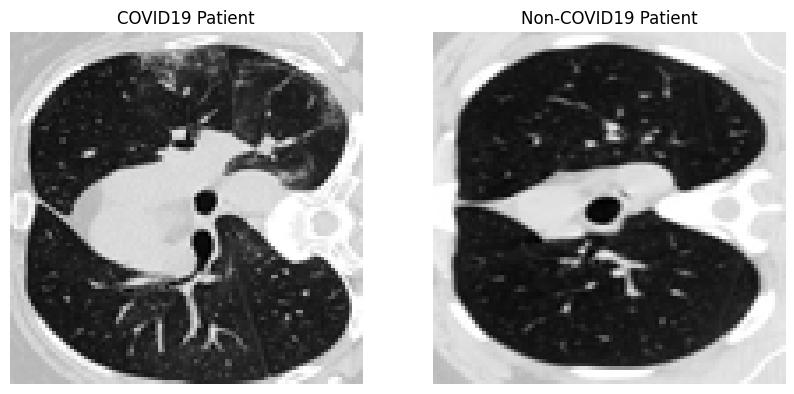

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plot_image(covid[5, :, :], "COVID19 Patient")

plt.subplot(1, 2, 2)
plot_image(ncovid[5, :, :], "Non-COVID19 Patient")

plt.show()

## 3) Codificación de las imágenes

<p style="font-size: 24px;">
    Es necesario contar con una codificación para el entrenamiento, ya que se trata con un problema de clasificación. Se asignará un <strong>1 para los pacientes con COVID</strong> y un <strong>0 para aquellos sin COVID</strong>.
</p>

<p style="font-size: 24px;">
    Más importante aun, es asegurarse de hacer una aleatorización de los datos, para que el entrenamiento sea firme.
</p>

In [ ]:
# Se agregan labels al covid y ncovid, en que un 1 es covid y un 0 para ncovid
covid_labeled = np.hstack((covid_reshaped, np.ones((covid_reshaped.shape[0], 1))))
ncovid_labeled = np.hstack((ncovid_reshaped, np.zeros((ncovid_reshaped.shape[0], 1))))

# Se genera un solo df de forma vertical (covid sobre ncovid)
df = np.vstack((covid_labeled, ncovid_labeled))

# Setea un seed (por consistencia)
np.random.seed(1234)

# Hace un shuffle del array para que se aleatorice
shuffle = np.random.permutation(df.shape[0])
df = df[shuffle]

## 4) Separación de los datos de entrenamiento y testeo

<p style="font-size: 24px;">
  Para construir un modelo, es necesario entrenarlo y luego probarlo. Existen múltiples formas de seleccionar los datos de entrenamiento y testeo:
</p>

<ul style="font-size: 18px;">
  <li><strong>Hold-Out (HO):</strong> porcentajes fijos</li>
  <li><strong>Cross-Validation (CV):</strong> crea múltiples (k) particiones en vez de solo dos como en HO</li>
  <li><strong>Nested-Cross-Validation (NCV):</strong> crea particiones dentro de las particiones</li>
  <li><strong>Leave-One-Out Cross-Validation (LOOCV):</strong> usa tantas particiones como instancias en el dataset</li>  
</ul>

<p style="font-size: 24px;">
  En nuestro caso usaremos HO por la sencillez a nivel computacional y de rendimiento.
</p>


In [ ]:
# Setear la seed
np.random.seed(2022)

# Se separa la data en 70% training y 30% test
split = np.random.choice([1, 2], size=df.shape[0], p=[0.7, 0.3])

# Saca los datos de entreno y testeo
train = df[split == 1, :10000]
test = df[split == 2, :10000]

# Saca los labels
train_target = df[split == 1, 10000]
test_target = df[split == 2, 10000]

print("Tamaño del entrenamiento:", train.shape)
print("Tamaño del testeo:", test.shape)

Tamaño del entrenamiento: (1720, 10000)
Tamaño del testeo: (761, 10000)


## 5) Entrenamiento del modelo

<p style="font-size: 24px;">
  Entrenar un modelo se compone de múltiples etapas, que dependerán de la profundidad del dataset, la cantidad de variables involucradas y en general el rendimiento que se desea obtener. La idea principal de una red neuronal es realizar una <strong>regresión a base de múltiples capas de procesamiento</strong>, con una cantidad de neuronas definidas y una función de activación diferente.
</p>

<p align="center">
  <img src="https://miro.medium.com/v2/resize:fit:828/format:webp/1*gKFs7YU44vJFiS2rF3-bpg.png" alt="perceptrón" style="width: 60%; height: auto;">
</p>

<p style="font-size: 24px;">
  Sin embargo, en vez de hablar de <em>pendientes</em>, se habla de <em>pesos</em>, donde dependiendo de la suma de los pesos con sus respectivas variables, la neurona se activará o no (de aquí la evidente relación con una regresión lineal).
</p>

<p style="font-size: 24px;">
  Existen múltiples capas que se le pueden agregar al modelo, estas se pueden revisar en la <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers">documentación de Keras</a>. Para este ejemplo, usaremos <strong>Dense</strong> (as in deeply connected) y <strong>Dropout</strong> (para evitar memorización en vez de aprendizaje).
</p>

<p align="center">
  <img src="https://www.baeldung.com/wp-content/uploads/sites/4/2023/04/Fig-1-3-scaled-1.jpg" alt="Dense layer" style="width: 60%; height: auto;">
</p>

<p align="center">
  <img src="https://www.baeldung.com/wp-content/uploads/sites/4/2020/05/2-1-2048x745-1.jpg" alt="Dropout layer" style="width: 60%; height: auto;">
</p>




### Primero se construye el modelo con las capas secuencialmente y se compila

In [ ]:
# Se construye el modelo
model = Sequential()

# Se agregan las capas de 80, 40 y 20 unidades de función rectifier (ReLU)
model.add(Dense(80, activation='relu', input_shape=(10000,)))
model.add(Dense(40, activation='relu', input_shape=(10000,)))
model.add(Dense(20, activation='relu', input_shape=(10000,)))
# Se agrega una capa de dropout del 20%
model.add(Dropout(0.20))
# Se agrega una capa de salida coherente con la codificación (1 o 0, 2 unidades), con la función softmax (exponencial normalizada)
model.add(Dense(2, activation='softmax'))
# Se compila el modelo con el optimizador Adam (adaptative learning rates)
model.compile(optimizer='adam',
            loss='binary_crossentropy',
            metrics=['accuracy'])
# Se asignan los labels basándonos en la codificación
train_label = to_categorical(train_target)
test_label = to_categorical(test_target)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Seguidamente se entrena el modelo

In [ ]:
epochs = 50

fit_covid = model.fit(x=train,
                      y=train_label,
                      epochs=epochs,
                      batch_size=16,
                      verbose=1,
                      validation_split=0.2)

Epoch 1/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.5429 - loss: 0.8424 - val_accuracy: 0.7267 - val_loss: 0.5885
Epoch 2/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6117 - loss: 0.6618 - val_accuracy: 0.6308 - val_loss: 0.6248
Epoch 3/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6665 - loss: 0.6115 - val_accuracy: 0.7093 - val_loss: 0.5709
Epoch 4/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6495 - loss: 0.6131 - val_accuracy: 0.7151 - val_loss: 0.5361
Epoch 5/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6883 - loss: 0.5753 - val_accuracy: 0.7093 - val_loss: 0.5490
Epoch 6/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6770 - loss: 0.6121 - val_accuracy: 0.6628 - val_loss: 0.6106
Epoch 7/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6613 - loss: 0.5811 - val_accuracy: 0.6221 - val_loss: 0.6462
Epoch 8/50
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7258 - loss: 0.5513 - val_accuracy: 0.6890 - v

### Entrenado el modelo, se necesita apreciar su exactitud y pérdida

In [ ]:
# Graficación del accuracy y loss

def plot_with_spline(x, y, label, color):
    x_smooth = np.linspace(x.min(), x.max(), 500)
    spline = make_interp_spline(x, y, k=3)
    y_smooth = spline(x_smooth)
    plt.plot(x_smooth, y_smooth, color=color, label=label)

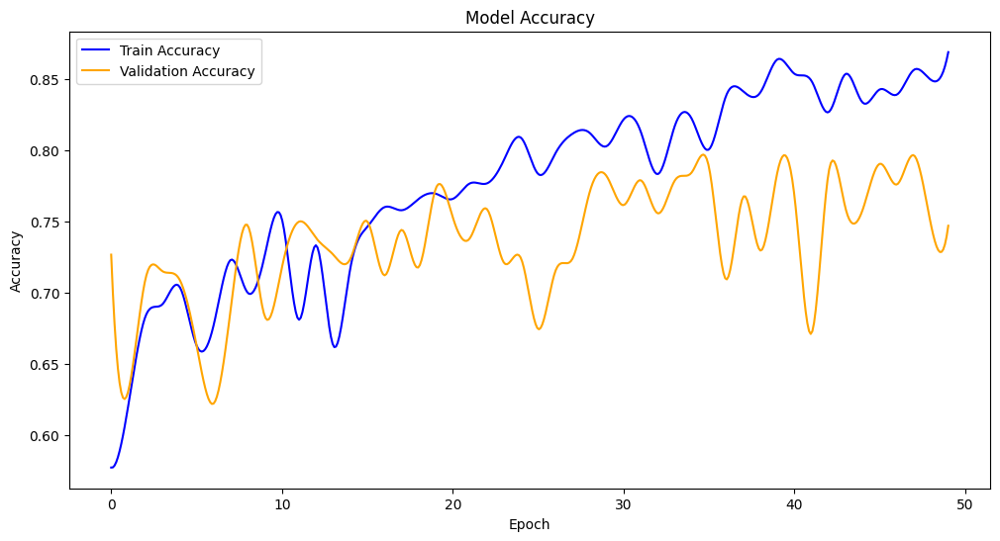

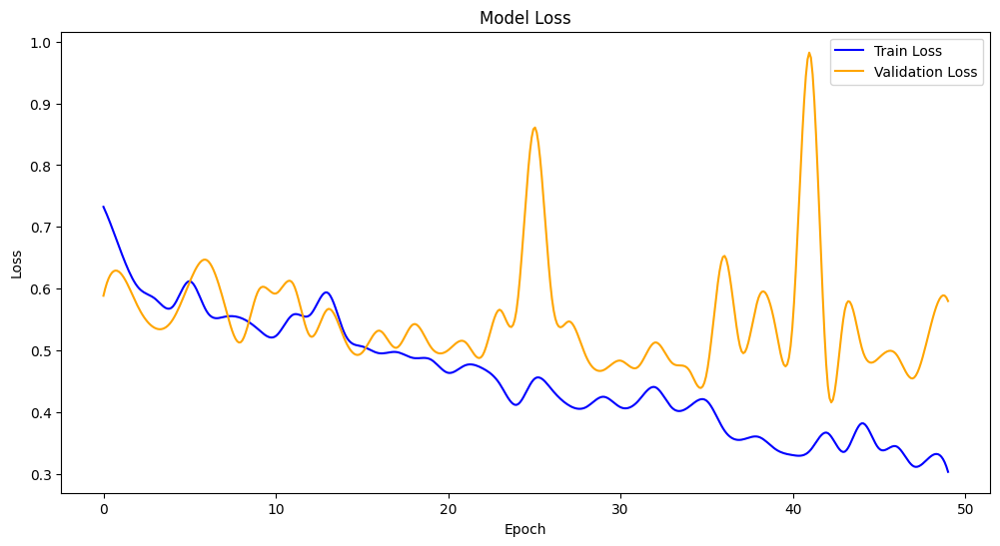

In [ ]:
# Gráfico de training & validation accuracy con un spline
plt.figure(figsize=(12, 6))
x_acc = np.arange(len(fit_covid.history['accuracy']))
plot_with_spline(x_acc, fit_covid.history['accuracy'], 'Train Accuracy', 'blue')
plot_with_spline(x_acc, fit_covid.history['val_accuracy'], 'Validation Accuracy', 'orange')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Gráfico de training & validation loss con un spline
plt.figure(figsize=(12, 6))
x_loss = np.arange(len(fit_covid.history['loss']))
plot_with_spline(x_loss, fit_covid.history['loss'], 'Train Loss', 'blue')
plot_with_spline(x_loss, fit_covid.history['val_loss'], 'Validation Loss', 'orange')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## 6) Evaluación del modelo

<p style="font-size: 24px;">
  Para evaluar el modelo, nuestra principal métrica será la <strong>exactitud</strong>. Además, haremos uso de la <strong>matriz de confusión</strong> para entender la distribución de aciertos-fallos del modelo, así como otros parámetros descriptivos.
</p>


In [ ]:
# Se evalua el modelo con los datos de testing
test_loss, test_accuracy = model.evaluate(test, test_label, verbose=1)

print(f'Test loss: {test_loss}')
print(f'Exactitud de prueba: {test_accuracy}')

# Se predicen las probabilidades en el test
predictions_prob = model.predict(test)
# Se convierten a labels de predicción
predictions = np.argmax(predictions_prob, axis=1)
# Se pasan a labels
expected_value = np.argmax(test_label, axis=1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7627 - loss: 0.5035
Test loss: 0.523205578327179
Exactitud de prueba: 0.7752956748008728
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


### Se visualiza la matriz de confusión

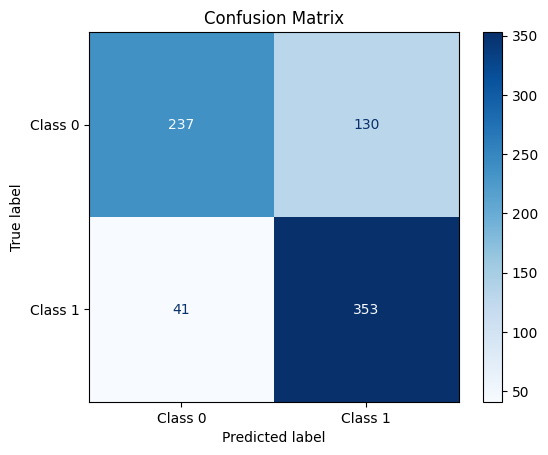

In [ ]:
# Se categorizan las predicciones y valores esperados
predictions = np.array(predictions)
expected_value = np.array(expected_value)

# Se computa la matriz de confusión
cm = confusion_matrix(expected_value, predictions)
cm_df = pd.DataFrame(cm, index=['0', '1'], columns=['0', '1'])

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Se calculan los estadísticos
accuracy = accuracy_score(expected_value, predictions)
precision = precision_score(expected_value, predictions, average='binary')
recall = recall_score(expected_value, predictions, average='binary')
f1 = f1_score(expected_value, predictions, average='binary')
kappa = cohen_kappa_score(expected_value, predictions)

# Cálculo de las métricas
sensitivity = recall
specificity = cm[1, 1] / (cm[1, 1] + cm[1, 0]) if (cm[1, 1] + cm[1, 0]) > 0 else np.nan
positive_pred_value = precision
negative_pred_value = cm[0, 0] / (cm[0, 0] + cm[0, 1]) if (cm[0, 0] + cm[0, 1]) > 0 else np.nan
prevalence = (cm[0, 0] + cm[0, 1]) / np.sum(cm)
detection_rate = sensitivity
detection_prevalence = cm[1, 1] / np.sum(cm)
balanced_accuracy = (sensitivity + specificity) / 2

print("Matriz de Confusión:\n")
print(cm_df)
print("\n")
print(f"Exactitud : {accuracy:.4f}")
print(f"Tasa de Información Nula : {accuracy:.4f}")
print(f"Kappa : {kappa:.4f}")
print(f"Sensibilidad : {sensitivity:.4f}")
print(f"Especificidad : {specificity:.4f}")
print(f"Valor Predicho Positivo : {positive_pred_value:.4f}")
print(f"Valor Predicho Negativo : {negative_pred_value:.4f}")
print(f"Prevalencia : {prevalence:.4f}")
print(f"Tasa de Detección : {detection_rate:.4f}")
print(f"Prevalencia de Detección : {detection_prevalence:.4f}")
print(f"Exactitud Balanceada : {balanced_accuracy:.4f}")
print("\nClase 'Positiva' : 1")

Matriz de Confusión:

     0    1
0  237  130
1   41  353


Exactitud : 0.7753
Tasa de Información Nula : 0.7753
Kappa : 0.5463
Sensibilidad : 0.8959
Especificidad : 0.8959
Valor Predicho Positivo : 0.7308
Valor Predicho Negativo : 0.6458
Prevalencia : 0.4823
Tasa de Detección : 0.8959
Prevalencia de Detección : 0.4639
Exactitud Balanceada : 0.8959

Clase 'Positiva' : 1


## 7) Ejecución de un bucle de repeticiones/testeo*

### *Opcional

<p style="font-size: 24px;">
  En caso de querer hacer pruebas de repetibilidad, se provee un bloque conciso que corre modificando el modelo, por lo que igualmente necesita de la existencia de los datos y los pasos previos.
</p>

In [ ]:
accuracy_lista = []

for i in range(5):
    model = Sequential()
    model.add(Dense(80, activation='relu', input_shape=(10000,)))
    model.add(Dense(40, activation='relu', input_shape=(10000,)))
    model.add(Dense(20, activation='relu', input_shape=(10000,)))
    model.add(Dropout(0.20))
    model.add(Dense(2, activation='softmax'))
    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
    train_label = to_categorical(train_target)
    test_label = to_categorical(test_target)
    fit_covid = model.fit(x=train,
                      y=train_label,
                      epochs=10,
                      batch_size=16,
                      verbose=1,
                      validation_split=0.2)
    test_loss, test_accuracy = model.evaluate(test, test_label, verbose=1)

    predictions_prob = model.predict(test)

    predictions = np.argmax(predictions_prob, axis=1)
    expected_value = np.argmax(test_label, axis=1)

    predictions = np.array(predictions)
    expected_value = np.array(expected_value)

    cm = confusion_matrix(expected_value, predictions)

    predictions = np.array(predictions)
    expected_value = np.array(expected_value)


    cm = confusion_matrix(expected_value, predictions)
    cm_df = pd.DataFrame(cm, index=['0', '1'], columns=['0', '1'])


    accuracy = accuracy_score(expected_value, predictions)
    accuracy_lista.append(accuracy)

print("The mean accuracy is", np.mean(accuracy_lista))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.5571 - loss: 0.8919 - val_accuracy: 0.6192 - val_loss: 0.6236
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6363 - loss: 0.6308 - val_accuracy: 0.7064 - val_loss: 0.5865
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6653 - loss: 0.5970 - val_accuracy: 0.7384 - val_loss: 0.5585
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.6982 - loss: 0.5802 - val_accuracy: 0.7297 - val_loss: 0.5477
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.7105 - loss: 0.5600 - val_accuracy: 0.7384 - val_loss: 0.5312
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7167 - loss: 0.5605 - val_accuracy: 0.6599 - val_loss: 0.5907
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6954 - loss: 0.5794 - val_accuracy: 0.6541 - val_loss: 0.5856
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7213 - loss: 0.5425 - val_accuracy: 0.6948 - v

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5416 - loss: 0.8906 - val_accuracy: 0.6047 - val_loss: 0.6330
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.5756 - loss: 0.6963 - val_accuracy: 0.6686 - val_loss: 0.6063
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.6881 - loss: 0.5920 - val_accuracy: 0.6221 - val_loss: 0.6121
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6423 - loss: 0.6061 - val_accuracy: 0.7384 - val_loss: 0.5397
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6718 - loss: 0.6013 - val_accuracy: 0.6134 - val_loss: 0.6185
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7108 - loss: 0.5664 - val_accuracy: 0.6744 - val_loss: 0.6060
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6905 - loss: 0.5851 - val_accuracy: 0.6599 - val_loss: 0.6044
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7327 - loss: 0.5226 - val_accuracy: 0.7529 - v

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5391 - loss: 0.9312 - val_accuracy: 0.6831 - val_loss: 0.6508
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6448 - loss: 0.6502 - val_accuracy: 0.7209 - val_loss: 0.5792
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5910 - loss: 0.6453 - val_accuracy: 0.5174 - val_loss: 0.6517
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6063 - loss: 0.6100 - val_accuracy: 0.5174 - val_loss: 0.7415
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7096 - loss: 0.5645 - val_accuracy: 0.7442 - val_loss: 0.5349
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7271 - loss: 0.5674 - val_accuracy: 0.7209 - val_loss: 0.5451
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7448 - loss: 0.5389 - val_accuracy: 0.7384 - val_loss: 0.5385
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7657 - loss: 0.5069 - val_accuracy: 0.7558 - v

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5368 - loss: 0.7514 - val_accuracy: 0.6628 - val_loss: 0.6773
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6071 - loss: 0.6659 - val_accuracy: 0.6802 - val_loss: 0.6111
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6932 - loss: 0.6030 - val_accuracy: 0.7326 - val_loss: 0.5731
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7302 - loss: 0.5679 - val_accuracy: 0.7471 - val_loss: 0.5431
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7269 - loss: 0.5640 - val_accuracy: 0.7122 - val_loss: 0.5470
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7374 - loss: 0.5384 - val_accuracy: 0.7558 - val_loss: 0.5150
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6939 - loss: 0.5718 - val_accuracy: 0.6802 - val_loss: 0.5844
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7125 - loss: 0.5643 - val_accuracy: 0.7587 - v

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5200 - loss: 0.7743 - val_accuracy: 0.4826 - val_loss: 0.6933
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5338 - loss: 0.6872 - val_accuracy: 0.5465 - val_loss: 0.6612
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5176 - loss: 0.6937 - val_accuracy: 0.6599 - val_loss: 0.6520
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5510 - loss: 0.6872 - val_accuracy: 0.4855 - val_loss: 0.6499
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5209 - loss: 0.6707 - val_accuracy: 0.5756 - val_loss: 0.6410
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6102 - loss: 0.6551 - val_accuracy: 0.5814 - val_loss: 0.6419
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.6200 - loss: 0.6622 - val_accuracy: 0.5523 - val_loss: 0.6244
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6653 - loss: 0.6314 - val_accuracy: 0.6715 - v